<a href="https://colab.research.google.com/github/victormurcia/SquirrelML/blob/main/Squirrel_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The idea for this project is to train a ML model that predicts whether a squirrel will approach a person or not.

The final goal is to deploy the model as a Streamlit app, where a user can input things like the squirrels fur color and location

In [147]:
import sklearn
print(sklearn.__version__)
print(joblib.__version__)

1.2.2
1.3.2


In [ ]:
import pandas as pd
import geopandas as gpd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point
from scipy.spatial import Voronoi, voronoi_plot_2d
import re
import joblib
!pip install dataprep
import dataprep
from dataprep.eda import create_report
!pip install geofeather
import geofeather
!pip install -q shap
import shap
from tqdm.auto import tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 5.9 MB/s eta 0:00:00


# Load the Data

Computing values-1889d0b155c6a0ce178d04f18037abb2:  58%|█████▊    | 1890/3249 [00:01<00:00, 1830.62it/s]        invalid value encountered in divide
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is

My Report
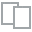
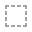
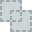
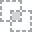
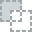
...
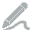
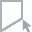
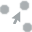
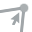
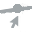

In [ ]:
ini_squirrel_df = pd.read_csv('/content/drive/MyDrive/SquirrelML/NYC_Squirrels.csv')
report1 = create_report(ini_squirrel_df, title='My Report')
report1

In [148]:
# Descriptive statistics for 'X'
x_description = ini_squirrel_df['X'].describe()

# Descriptive statistics for 'Y'
y_description = ini_squirrel_df['Y'].describe()

# Print the descriptions
print("Description of 'X':\n", x_description)
print("\nDescription of 'Y':\n", y_description)

Description of 'X':
 count    3023.000000
mean      -73.967184
std         0.007726
min       -73.981159
25%       -73.973102
50%       -73.968594
75%       -73.960189
max       -73.949722
Name: X, dtype: float64

Description of 'Y':
 count    3023.000000
mean       40.780853
std         0.010285
min        40.764911
25%        40.771676
50%        40.778166
75%        40.791219
max        40.800119
Name: Y, dtype: float64


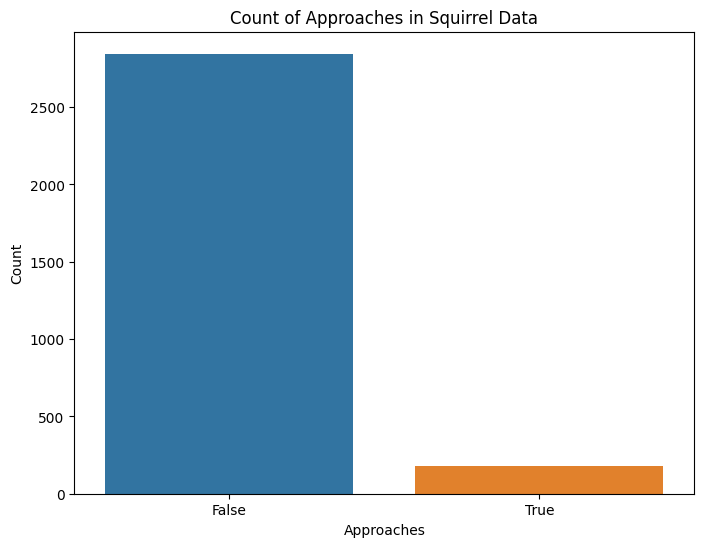

In [151]:

# Create a countplot
plt.figure(figsize=(8, 6))
sns.countplot(x='Approaches', data=ini_squirrel_df)
plt.title('Count of Approaches in Squirrel Data')
plt.xlabel('Approaches')
plt.ylabel('Count')
plt.show()

In [149]:
report1.save('/content/drive/MyDrive/SquirrelML/Initial EDA.html')

Report has been saved to /content/drive/MyDrive/SquirrelML/Initial EDA.html!


## Notes:

Lat/Long column is unnecessary since I have the X and Y columns. Will drop.

Other Interactions column has 92.1% of its entries missing. The top interaction
(runs from dog) only has 8 observations. I don't think this will be useful, so I'll drop it.

Runs From column is mostly False.

Indifferent column is pretty balanced in its observations.

Approaches is 94.11% False

Tail twitches is mostly False

Tail flags is 94.87%  False

Moans is 99.90% percent False. I don't think this will be useful so I'll probably drop it.

Quaas is 98.35% False.

Kuks is 96.63% False

Hmm, other activities has 307 unique categories. It might be worth looking deeper into it and see if some of them can be merged into other categories or if a new categorry can be created.

Foraging column is pretty balanced

Eating is mostly False

Climbing is mostly False

Chasing is mostly False

Running is mostly False

Hmmm, specific location has 304 unique entries. I'll have to look deeper into it.

The Above Ground Sighter Measurement is confusing in terms of what it means. Most of the entries are FALSE though.

The Location column is mostly Ground Plane

Color notes has 135 unique categories. I'll have to investigate further. It
also has 94% of entries missing.

Combination of Primary and Highlight Color column has 22 distinct categories. Will need to explore frther

Highlight Fur color has 10 distinct categories. These can probably just be their own category each but there are some commonalities that I could use for grouping further.

Primary Fur Color has 3 categories. Will leave like this.
Age has three categories, there is one labeled as '?' that i might just drop or try to impute

Hecatare Squirrel number might be interesting to keep since it could help inform a decision based on whether a squirrel was the first or nth sighting

Date might be interesting for visualization purposes but the time frame is only two weeks which might not be useful for forecasting

Shift is pretty balanced

Unique Squirrel Id can be dropped after removing any duplicates. I should see if there are any discrepancies in the observations made on the same squirrel.
Hectare has 339 unique values,I think I might drop this and use the Clusters I made instead to define a quadrant.

# EDA and Feature Engineering

## Pipeline

In [137]:
def preprocess_data(df):
    # Convert 'Date' from object to datetime
    df['Date'] = pd.to_datetime(df['Date'], format='%m%d%Y')

    # Extract day of the week and create a new column 'Day'
    df['Day'] = df['Date'].dt.day_name()

    # Function to determine if a day is a weekday or weekend
    def is_weekday(day):
        if day in ['Saturday', 'Sunday']:
            return False
        else:
            return True

    # Apply the function to create a new column 'Weekday'
    df['Weekday'] = df['Day'].apply(is_weekday)

    # Rename the 'Shift' column to 'Daytime'
    df.rename(columns={'Shift': 'Daytime'}, inplace=True)

    # Function to transform 'AM' to True and 'PM' to False
    def am_pm_to_bool(value):
        return True if value == 'AM' else False

    # Apply the function to the 'Daytime' column
    df['Daytime'] = df['Daytime'].apply(am_pm_to_bool)

    # Function to categorize as 'Mixed' if multiple colors are present
    def categorize_as_mixed(color):
        # Check if the color is a string and contains a comma
        if isinstance(color, str) and ',' in color:
            return 'Mixed'
        else:
            return color

    # Apply the function to the 'Highlight Fur Color' column
    df['Highlight Fur Color'] = df['Highlight Fur Color'].apply(categorize_as_mixed)

    # Columns to update
    columns_to_update = ['Age', 'Primary Fur Color', 'Highlight Fur Color', 'Location']

    # Replace NaNs with 'Unknown' in the specified columns
    for column in columns_to_update:
        df[column] = df[column].fillna('Unknown')

    # One hot encode Age
    df['Age'] = df['Age'].replace('?', 'Unknown')
    age_dummies = pd.get_dummies(df['Age'], prefix='Age')
    df = pd.concat([df, age_dummies], axis=1)

    # One hot encode Primary Fur Color
    pfc_dummies = pd.get_dummies(df['Primary Fur Color'], prefix='PFC')
    df = pd.concat([df, pfc_dummies], axis=1)

    # One hot encode Highlight Fur Color
    hfc_dummies = pd.get_dummies(df['Highlight Fur Color'], prefix='HFC')
    df = pd.concat([df, hfc_dummies], axis=1)

    # Rework Location column
    df.rename(columns={'Location': 'Located on Ground'}, inplace=True)
    df['Located on Ground'] = df['Located on Ground'] == 'Ground Plane'

    return df

def feature_engineering(df):
    # Function to determine if notable features are mentioned
    def has_notable_feature(notes, pattern):
        if pd.isna(notes):
            return False
        return bool(re.search(pattern, notes.lower()))

    # Define the keywords and their corresponding regex patterns
    keywords = ['belly', 'leg', 'tail', 'flank', 'coloration', 'shoulders', 'head', 'stripe',
                'tiny', 'underbelly', 'edges', 'look', 'butt', 'feet', 'beauty', 'injured',
                'puff', 'haunch', 'loss', 'nose', 'small', 'fat']
    pattern = r'\b(?:' + '|'.join([f"{word}(s|es)?" for word in keywords]) + r')\b'

    # Apply the function to create the new column 'Notable Feature'
    df['Notable Feature'] = df['Color notes'].apply(lambda x: has_notable_feature(x, pattern))

    # Function to create a matching column based on specified terms
    def create_matching_column(df, column_name, source_column, terms):
        pattern = '|'.join(terms)
        df[column_name] = df[source_column].str.contains(pattern, case=False, na=False)
        return df

    # Define lists of terms for various features
    tree_terms = ['tree', 'trees', 'maple', 'log', 'branch', 'oak', 'willow', 'trunk', 'stump', 'elm']
    shrubbery_terms = ['shrub', 'bush', 'weeds']
    rock_terms = ['rock', 'stone']
    grassland_terms = ['lawn', 'grass', 'field', 'glen']
    path_terms = ['path', 'road', 'pavement', 'street']
    structure_terms = ['conservatory', 'fountain', 'bench', 'fence', 'statue', 'bin', 'carousel', 'trellis',
                      'structure', 'car', 'table', 'ledge', 'railing', 'overpass', 'post', 'can', 'house',
                      'arch', 'bar', 'sanctuary', 'bridge', 'bike', 'rack', 'construction', 'playground']
    water_terms = ['water', 'shore', 'pond', 'pool', 'stream']

    # Lists of terms
    lists_of_terms = [
        tree_terms,
        shrubbery_terms,
        rock_terms,
        grassland_terms,
        path_terms,
        structure_terms,
        water_terms
    ]

    column_names = [
        'Seen in Tree',
        'Seen in Shrubbery',  # For shrub, bush, weeds
        'Seen in Rock',       # For rock, stone
        'Seen in Grassland',  # For lawn, grass, field, glen
        'Seen in Path',       # For path, road, pavement, street
        'Seen in Structure',  # For conservatory, fountain, bench, etc.
        'Seen in Water'       # For water, shore, pond, pool, stream
    ]

    # Apply regex matching for each set of terms and corresponding column names
    for column_name, terms in zip(column_names, lists_of_terms):  # ... (include other lists)
        df = create_matching_column(df, column_name, 'Specific Location', terms)

    playful_terms = ['play', 'jump', 'leap', 'hop', 'tease', 'chirp', 'pranc']
    burying_terms = ['bury', 'dig', 'buried', 'stash']
    relaxing_terms = ['chill', 'sit', 'stand', 'groom', 'clean', 'relax', 'lying', 'mosey', 'canoodl', 'sleep']

    column_names = [
        'Playful',
        'Digging',  # For shrub, bush, weeds
        'Relaxing',       # For rock, stone
    ]

    # Lists of terms
    lists_of_terms = [
        playful_terms,
        burying_terms,
        relaxing_terms
    ]

    # Iterate over lists of terms and corresponding column names to create new columns based on 'Specific Location'
    for column_name, terms in zip(column_names, lists_of_terms):
        df = create_matching_column(df, column_name, 'Other Activities', terms)

    cols_to_drop = ['Unique Squirrel ID','Lat/Long','Combination of Primary and Highlight Color','Color notes',
                'Hectare Squirrel Number','Specific Location','Day','Hectare','Above Ground Sighter Measurement',
                'Other Activities','Other Interactions','Age','Primary Fur Color','Highlight Fur Color','Location']

    # Drop columns if they exist in the DataFrame
    for col in cols_to_drop:
        if col in df.columns:
            df.drop(columns=[col], inplace=True)
    # Iterate through each column and convert boolean columns to uint8
    for column in df.columns:
        if df[column].dtype == 'bool':
            df[column] = df[column].astype('uint8')

    return df

# Function for Applying Clustering
def apply_clustering(df, num_clusters=4):
    kmeans = KMeans(n_clusters=num_clusters, n_init='auto')
    df['Cluster'] = kmeans.fit_predict(df[['X', 'Y']])
    centroids = kmeans.cluster_centers_

    # Assuming 'kmeans' is your trained KMeans model
    joblib.dump(kmeans, '/content/drive/MyDrive/SquirrelML/squirrel_kmeans.pkl')

    return df, centroids

# Main pipeline function
def processing_pipeline(filepath):
    # Load data
    df = pd.read_csv(filepath)

    # Preprocess data
    df = preprocess_data(df)

    # Feature Engineering
    df = feature_engineering(df)

    # Apply clustering
    df, centroids = apply_clustering(df)

    cols = [col for col in df.columns if col != 'Approaches']

    # Add 'Approaches' to the end of the list
    cols.append('Approaches')

    # Reorder the DataFrame columns
    df = df[cols]

    return df, centroids

## Run the Preprocessing Pipeline

In [139]:
# Applying the pipeline to your data
squirrel_df, centroids = processing_pipeline('/content/drive/MyDrive/SquirrelML/NYC_Squirrels.csv')
squirrel_df

,X,Y,Daytime,Date,Located on Ground,Running,Chasing,Climbing,Eating,Foraging,...,Seen in Rock,Seen in Grassland,Seen in Path,Seen in Structure,Seen in Water,Playful,Digging,Relaxing,Cluster,Approaches
0,-73.956134,40.794082,0,2018-10-14,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,-73.968857,40.783783,1,2018-10-19,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,3,0
2,-73.974281,40.775534,0,2018-10-14,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,-73.959641,40.790313,0,2018-10-17,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
4,-73.970268,40.776213,1,2018-10-17,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3018,-73.963943,40.790868,1,2018-10-07,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
3019,-73.970402,40.782560,0,2018-10-13,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,3,0
3020,-73.966587,40.783678,0,2018-10-12,1,0,0,0,1,1,...,0,0,0,0,0,0,0,0,3,0
3021,-73.963994,40.789915,0,2018-10-10,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
squirrel_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3023 entries, 0 to 3022
Data columns (total 44 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   X                  3023 non-null   float64       
 1   Y                  3023 non-null   float64       
 2   Daytime            3023 non-null   uint8         
 3   Date               3023 non-null   datetime64[ns]
 4   Located on Ground  3023 non-null   uint8         
 5   Running            3023 non-null   uint8         
 6   Chasing            3023 non-null   uint8         
 7   Climbing           3023 non-null   uint8         
 8   Eating             3023 non-null   uint8         
 9   Foraging           3023 non-null   uint8         
 10  Kuks               3023 non-null   uint8         
 11  Quaas              3023 non-null   uint8         
 12  Moans              3023 non-null   uint8         
 13  Tail flags         3023 non-null   uint8         
 14  Tail twi

## EDA on Preprocessed Dataset

Computing series-min-chunk-series-min-agg-a4cbd8479548ded8b96cadd106350a07:   2%|▏         | 79/4112 [00:00<00:05, 784.07it/s]invalid value encountered in divide


My Report
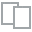
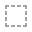
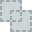
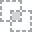
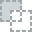
...
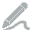
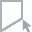
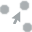
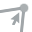
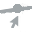

In [ ]:
from dataprep.eda import create_report
report = create_report(squirrel_df, title='My Report')
report

In [150]:
report.save('/content/drive/MyDrive/SquirrelML/Preprocessed EDA.html')

Report has been saved to /content/drive/MyDrive/SquirrelML/Preprocessed EDA.html!


## Dependency Plots

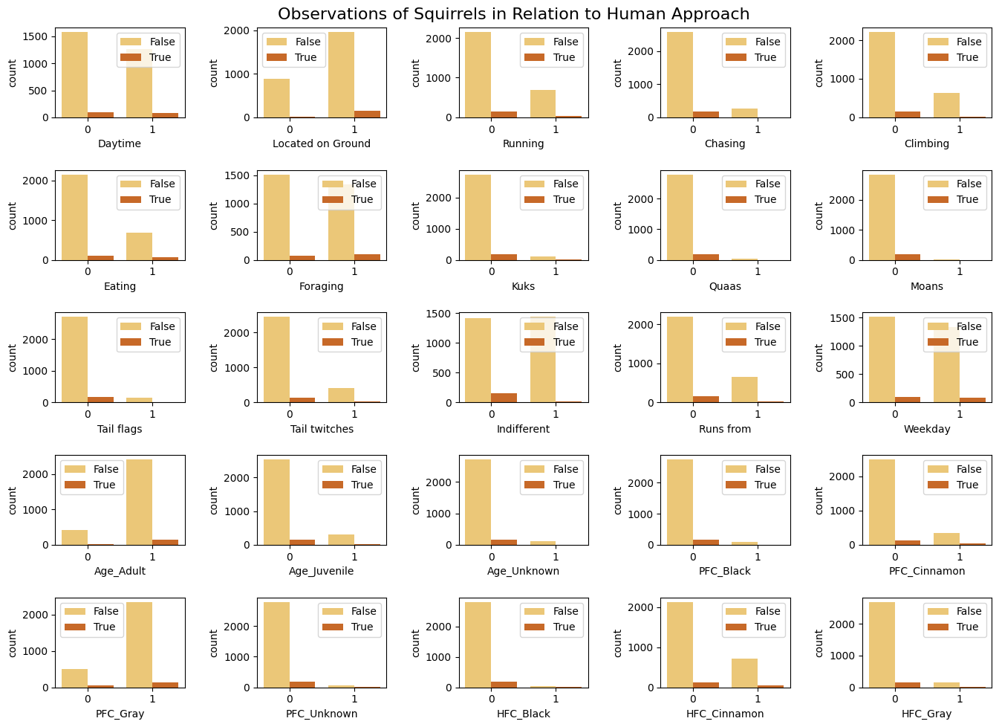

In [ ]:
columns_to_plot = ['Daytime','Located on Ground', 'Running', 'Chasing',
       'Climbing', 'Eating', 'Foraging','Kuks', 'Quaas', 'Moans',
        'Tail flags', 'Tail twitches', 'Indifferent', 'Runs from', 'Weekday',
       'Age_Adult','Age_Juvenile', 'Age_Unknown', 'PFC_Black', 'PFC_Cinnamon',
                   'PFC_Gray', 'PFC_Unknown', 'HFC_Black', 'HFC_Cinnamon', 'HFC_Gray']

# Set up the matplotlib figure
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(14, 10))  # Adjust the size as needed
fig.tight_layout(pad=3.0)
fig.suptitle('Observations of Squirrels in Relation to Human Approach', fontsize=16)
# Iterate over the columns and create a countplot for each
for i, column in enumerate(columns_to_plot):
    # Determine the position of the subplot
    row = i // 5
    col = i % 5
0000000000000000000000000000011111111111111111111111111
    # Create the countplot with the specified palette
    ax = sns.countplot(x=squirrel_df[column], hue=squirrel_df['Approaches'], ax=axes[row, col], palette='YlOrBr')

    # Set legend labels to 'True' and 'False' instead of '0' and '1'
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, ['False' if label == '0' else 'True' for label in labels])

# Show the plot
plt.show()

## Cluster Visualization

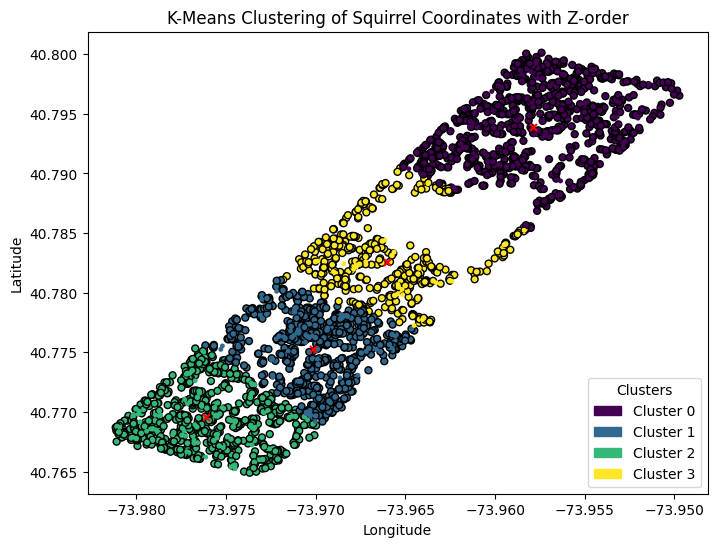

In [157]:
import matplotlib.patches as mpatches
# Visualization
plt.figure(figsize=(8, 6))

marker_size = 25

# Plotting all points (Approach = False)
plt.scatter(squirrel_df[squirrel_df['Approaches'] == False]['X'],
            squirrel_df[squirrel_df['Approaches'] == False]['Y'],
            c=squirrel_df[squirrel_df['Approaches'] == False]['Cluster'],
            cmap='viridis', marker='o', s=marker_size, label='Approaches=False', zorder=1,
            facecolors='none' if True else 'black', edgecolors='black')

# Plotting points where Approach = True on top
plt.scatter(squirrel_df[squirrel_df['Approaches'] == True]['X'],
            squirrel_df[squirrel_df['Approaches'] == True]['Y'],
            c=squirrel_df[squirrel_df['Approaches'] == True]['Cluster'],
            cmap='viridis', marker='.', s=marker_size, label='Approaches=True', zorder=2)

plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', label='Centroids', s=marker_size, zorder=3)  # Marking centroids
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('K-Means Clustering of Squirrel Coordinates with Z-order')

# First legend for approaches
plt.legend(title="Squirrel Behavior", loc='upper left')

# Create custom patches for the second legend
cluster_colors = plt.cm.viridis(np.linspace(0, 1, 4))  # Assuming 4 clusters, adjust if different
cluster_patches = [mpatches.Patch(color=cluster_colors[i], label=f'Cluster {i}') for i in range(4)]

# Add second legend for clusters
plt.legend(handles=cluster_patches, title="Clusters", loc='lower right')

# Show the plot
plt.show()

<Figure size 1000x600 with 0 Axes>

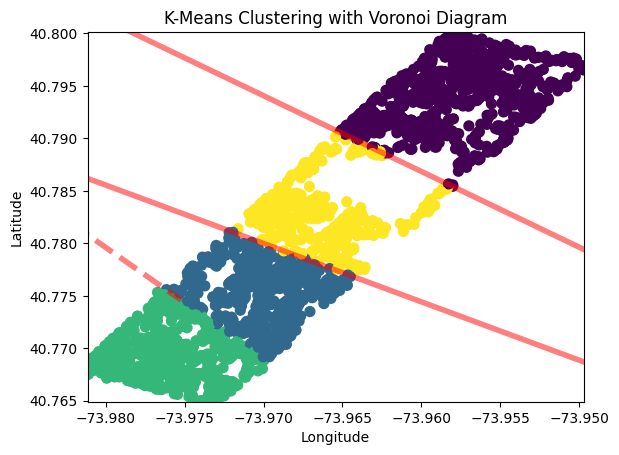

In [155]:
# Create Voronoi Diagram
vor = Voronoi(centroids,furthest_site=False)

# Visualization
plt.figure(figsize=(10, 6))

# Plot Voronoi diagram
voronoi_plot_2d(vor, show_vertices=False, show_points=False, line_colors='red', line_width=4,line_alpha=0.5,point_size=20)

# Plotting points
plt.scatter(squirrel_df['X'], squirrel_df['Y'], c=squirrel_df['Cluster'], cmap='viridis', marker='o', s=50)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
# Adjusting the axis limits
plt.xlim(squirrel_df['X'].min(), squirrel_df['X'].max())
plt.ylim(squirrel_df['Y'].min(), squirrel_df['Y'].max())
plt.title('K-Means Clustering with Voronoi Diagram')
plt.show()

<Figure size 1000x600 with 0 Axes>

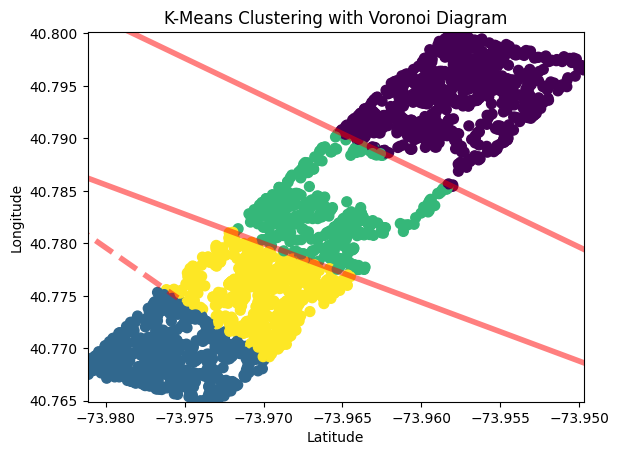

In [ ]:
# Create Voronoi Diagram
vor = Voronoi(centroids,furthest_site=False)

# Visualization
plt.figure(figsize=(10, 6))

# Plot Voronoi diagram
voronoi_plot_2d(vor, show_vertices=False, show_points=False, line_colors='red', line_width=4,line_alpha=0.5,point_size=20)

# Plotting points
plt.scatter(squirrel_df['X'], squirrel_df['Y'], c=squirrel_df['Cluster'], cmap='viridis', marker='o', s=50)

plt.xlabel('Latitude')
plt.ylabel('Longitude')
# Adjusting the axis limits
plt.xlim(squirrel_df['X'].min(), squirrel_df['X'].max())
plt.ylim(squirrel_df['Y'].min(), squirrel_df['Y'].max())
plt.title('K-Means Clustering with Voronoi Diagram')
plt.show()

# Building the Model

I'm either going to do Random Forest or Decision Tree because Squirrels obviously

In [136]:
squirrel_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3023 entries, 0 to 3022
Data columns (total 43 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   X                  3023 non-null   float64
 1   Y                  3023 non-null   float64
 2   Daytime            3023 non-null   uint8  
 3   Located on Ground  3023 non-null   uint8  
 4   Running            3023 non-null   uint8  
 5   Chasing            3023 non-null   uint8  
 6   Climbing           3023 non-null   uint8  
 7   Eating             3023 non-null   uint8  
 8   Foraging           3023 non-null   uint8  
 9   Kuks               3023 non-null   uint8  
 10  Quaas              3023 non-null   uint8  
 11  Moans              3023 non-null   uint8  
 12  Tail flags         3023 non-null   uint8  
 13  Tail twitches      3023 non-null   uint8  
 14  Indifferent        3023 non-null   uint8  
 15  Runs from          3023 non-null   uint8  
 16  Weekday            3023 

In [ ]:
squirrel_df = squirrel_df.drop(columns=['Date'])
squirrel_df

,X,Y,Daytime,Located on Ground,Running,Chasing,Climbing,Eating,Foraging,Kuks,...,Seen in Rock,Seen in Grassland,Seen in Path,Seen in Structure,Seen in Water,Playful,Digging,Relaxing,Cluster,Approaches
0,-73.956134,40.794082,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,-73.968857,40.783783,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,3,0
2,-73.974281,40.775534,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-73.959641,40.790313,0,0,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,1,0
4,-73.970268,40.776213,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3018,-73.963943,40.790868,1,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,1,0
3019,-73.970402,40.782560,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,3,0
3020,-73.966587,40.783678,0,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,3,0
3021,-73.963994,40.789915,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,3,0


In [103]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_recall_curve, auc, classification_report
from sklearn.preprocessing import label_binarize

# Assuming squirrel_df is your DataFrame and 'Approaches' is the target variable
X = squirrel_df.drop('Approaches', axis=1)  # Features
y = squirrel_df['Approaches']  # Target

# Stratify the split to maintain the class distribution in train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

## First training

In [ ]:
# Initialize classifiers with class weights
rf_classifier = RandomForestClassifier(random_state=42, class_weight='balanced')
dt_classifier = DecisionTreeClassifier(random_state=42, class_weight='balanced')

# Train classifiers
rf_classifier.fit(X_train, y_train)
dt_classifier.fit(X_train, y_train)

# Predict probabilities for PR-AUC
rf_probs = rf_classifier.predict_proba(X_test)[:, 1]
dt_probs = dt_classifier.predict_proba(X_test)[:, 1]

# Compute Precision-Recall curve and AUC for Random Forest
rf_precision, rf_recall, _ = precision_recall_curve(y_test, rf_probs)
rf_auc = auc(rf_recall, rf_precision)

# Compute Precision-Recall curve and AUC for Decision Tree
dt_precision, dt_recall, _ = precision_recall_curve(y_test, dt_probs)
dt_auc = auc(dt_recall, dt_precision)

# Output the PR-AUC
print(f"Random Forest PR-AUC: {rf_auc:.2f}")
print(f"Decision Tree PR-AUC: {dt_auc:.2f}")

# Output classification reports
print("\nRandom Forest Classifier Performance:")
print(classification_report(y_test, rf_classifier.predict(X_test)))

print("\nDecision Tree Classifier Performance:")
print(classification_report(y_test, dt_classifier.predict(X_test)))

Random Forest PR-AUC: 0.44
Decision Tree PR-AUC: 0.38

Random Forest Classifier Performance:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       569
           1       0.67      0.17      0.27        36

    accuracy                           0.95       605
   macro avg       0.81      0.58      0.62       605
weighted avg       0.93      0.95      0.93       605


Decision Tree Classifier Performance:
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       569
           1       0.33      0.39      0.35        36

    accuracy                           0.92       605
   macro avg       0.64      0.67      0.65       605
weighted avg       0.92      0.92      0.92       605



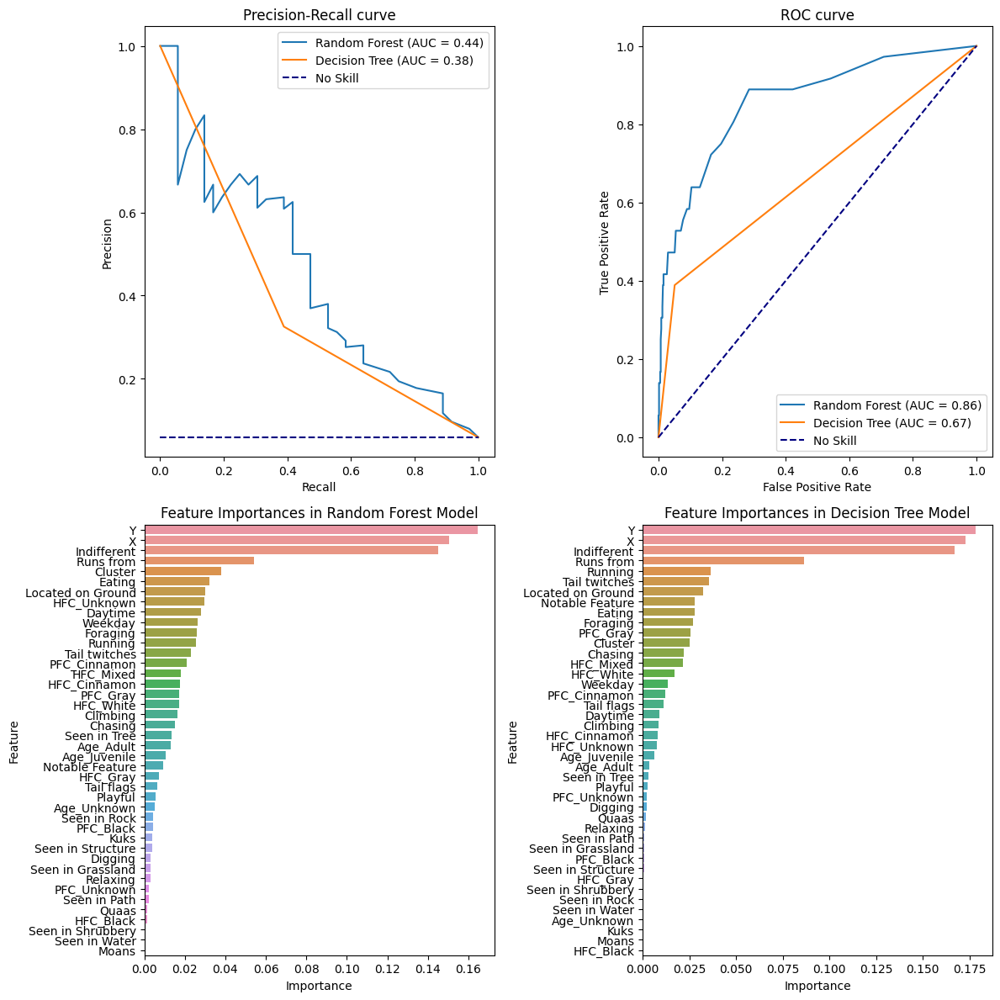

In [ ]:
from sklearn.metrics import precision_recall_curve, auc, roc_curve

# Compute ROC curve and AUC for Random Forest
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
rf_roc_auc = auc(rf_fpr, rf_tpr)

# Compute ROC curve and AUC for Decision Tree
dt_fpr, dt_tpr, _ = roc_curve(y_test, dt_probs)
dt_roc_auc = auc(dt_fpr, dt_tpr)

# Set up a 2x2 subplot grid
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))

# PR Curve
ax1.plot(rf_recall, rf_precision, label=f'Random Forest (AUC = {rf_auc:.2f})')
ax1.plot(dt_recall, dt_precision, label=f'Decision Tree (AUC = {dt_auc:.2f})')
# Calculate the proportion of positives (no skill classifier's precision)
proportion_of_positives = np.mean(y_test)
# Plot no skill classifier line
ax1.plot([0, 1], [proportion_of_positives, proportion_of_positives],  color='navy', linestyle='--', label='No Skill')
ax1.set_title('Precision-Recall curve')
ax1.set_xlabel('Recall')
ax1.set_ylabel('Precision')
ax1.legend()

# ROC Curve
ax2.plot(rf_fpr, rf_tpr, label=f'Random Forest (AUC = {rf_roc_auc:.2f})')
ax2.plot(dt_fpr, dt_tpr, label=f'Decision Tree (AUC = {dt_roc_auc:.2f})')
ax2.plot([0, 1], [0, 1], color='navy', linestyle='--', label='No Skill')
ax2.set_title('ROC curve')
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.legend()

# Feature Importances
# Assuming rf_classifier and X are defined and rf_classifier is trained
rf_importances = rf_classifier.feature_importances_
feature_names = X.columns
rf_feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': rf_importances})
rf_feature_importance_df = rf_feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
sns.barplot(x='Importance', y='Feature', data=rf_feature_importance_df, ax=ax3)
ax3.set_title('Feature Importances in Random Forest Model')

# Feature Importances
# Assuming dt_classifier and X are defined and rf_classifier is trained
dt_importances = dt_classifier.feature_importances_
feature_names = X.columns
dt_feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': dt_importances})
dt_feature_importance_df = dt_feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
sns.barplot(x='Importance', y='Feature', data=dt_feature_importance_df, ax=ax4)
ax4.set_title('Feature Importances in Decision Tree Model')

# Adjust layout
plt.tight_layout()
plt.show()

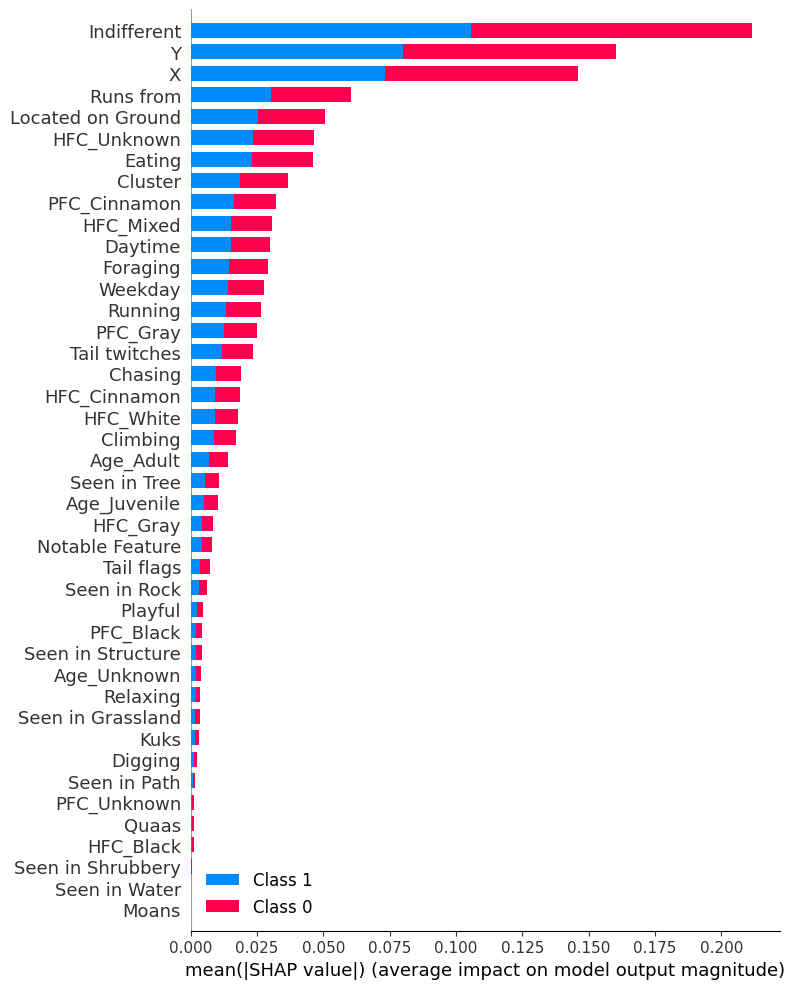

In [ ]:
# Initialize the SHAP explainer with the Random Forest model
rf_explainer = shap.TreeExplainer(rf_classifier)

# Compute SHAP values for the test set
rf_shap_values = rf_explainer.shap_values(X_test)

# SHAP Summary Plot - plotted separately
shap.summary_plot(rf_shap_values, X_test, plot_type="bar",plot_size=[8,10],max_display=50,cmap='viridis')

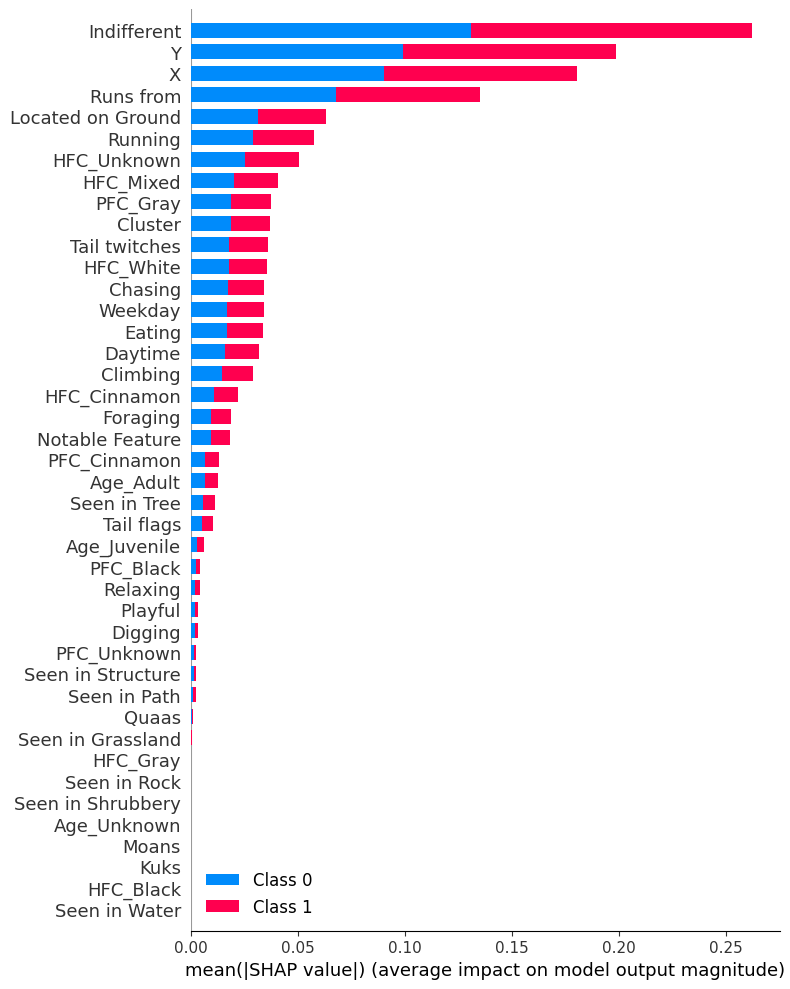

In [ ]:
# Initialize the SHAP explainer with the Random Forest model
dt_explainer = shap.TreeExplainer(dt_classifier)

# Compute SHAP values for the test set
dt_shap_values = dt_explainer.shap_values(X_test)

# SHAP Summary Plot - plotted separately
shap.summary_plot(dt_shap_values, X_test, plot_type="bar",plot_size=[8,10],max_display=50,cmap='viridis')

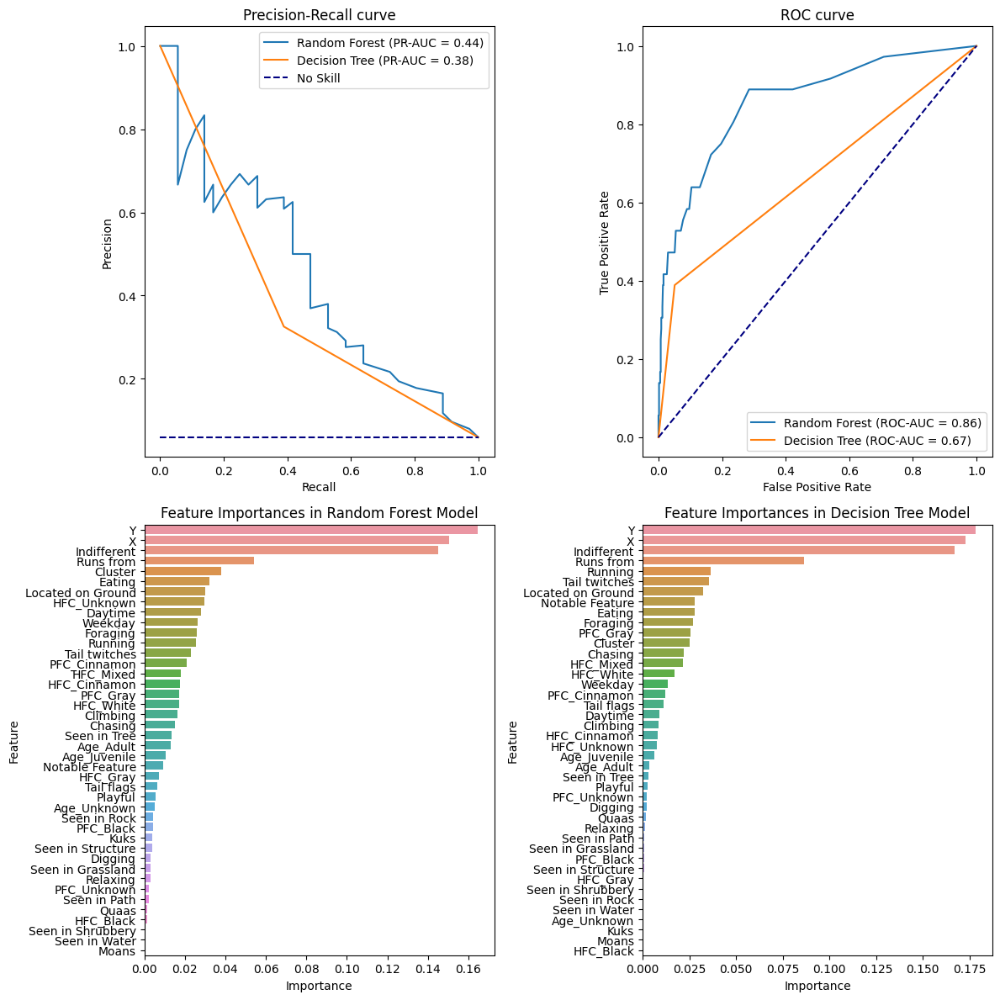

In [47]:
# Use the best random forest estimator to make predictions
best_rf_classifier = rf_grid_search.best_estimator_

# Predict random forest probabilities on the test set
rf_probs = best_rf_classifier.predict_proba(X_test)[:, 1]

# Use the best decision tree estimator to make predictions
best_dt_classifier = dt_grid_search.best_estimator_

# Predict decision tree  probabilities on the test set
dt_probs = best_dt_classifier.predict_proba(X_test)[:, 1]

# Compute Precision-Recall curve and AUC for Random Forest
rf_precision, rf_recall, _ = precision_recall_curve(y_test, rf_probs)
rf_pr_auc = auc(rf_recall, rf_precision)

# Compute Precision-Recall curve and AUC for Decision Tree
dt_precision, dt_recall, _ = precision_recall_curve(y_test, dt_probs)
dt_pr_auc = auc(dt_recall, dt_precision)

# Set up a 2x2 subplot grid
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))

# PR Curve for Random Forest and Decision Tree
ax1.plot(rf_recall, rf_precision, label=f'Random Forest (PR-AUC = {rf_pr_auc:.2f})')
ax1.plot(dt_recall, dt_precision, label=f'Decision Tree (PR-AUC = {dt_pr_auc:.2f})')
proportion_of_positives = np.mean(y_test)
ax1.plot([0, 1], [proportion_of_positives, proportion_of_positives], color='navy', linestyle='--', label='No Skill')
ax1.set_title('Precision-Recall curve')
ax1.set_xlabel('Recall')
ax1.set_ylabel('Precision')
ax1.legend()

# ROC Curve
ax2.plot(rf_fpr, rf_tpr, label=f'Random Forest (ROC-AUC = {rf_roc_auc:.2f})')
ax2.plot(dt_fpr, dt_tpr, label=f'Decision Tree (ROC-AUC = {dt_roc_auc:.2f})')
ax2.plot([0, 1], [0, 1], color='navy', linestyle='--')
ax2.set_title('ROC curve')
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.legend()

# Feature Importances
# Assuming rf_classifier and X are defined and rf_classifier is trained
rf_importances = rf_classifier.feature_importances_
feature_names = X.columns
rf_feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': rf_importances})
rf_feature_importance_df = rf_feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
sns.barplot(x='Importance', y='Feature', data=rf_feature_importance_df, ax=ax3)
ax3.set_title('Feature Importances in Random Forest Model')

# Feature Importances
# Assuming dt_classifier and X are defined and rf_classifier is trained
dt_importances = dt_classifier.feature_importances_
feature_names = X.columns
dt_feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': dt_importances})
dt_feature_importance_df = dt_feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
sns.barplot(x='Importance', y='Feature', data=dt_feature_importance_df, ax=ax4)
ax4.set_title('Feature Importances in Decision Tree Model')

# Adjust layout
plt.tight_layout()
plt.show()

## First Hyperparameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# Define the parameter grid for Random Forest
rf_param_grid = {
    'n_estimators': [1000, 2000, 3000],  # Number of trees in the forest
    'max_depth': [2,5,7,10, 20, None],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 3, 5, 10]  # Minimum number of samples required at each leaf node
}

# Initialize the GridSearchCV object
rf_grid_search = GridSearchCV(estimator=RandomForestClassifier(random_state=42, class_weight='balanced'),
                              param_grid=rf_param_grid,
                              cv=5,  # 5-fold cross-validation
                              scoring='roc_auc',  # You can also use 'average_precision' for PR AUC
                              n_jobs=-1,  # Use all available cores
                              verbose=2)

# Fit the grid search to the data
rf_grid_search.fit(X_train, y_train)

# Best parameters and score
print("Best parameters for Random Forest:", rf_grid_search.best_params_)
print("Best score:", rf_grid_search.best_score_)

Fitting 5 folds for each of 270 candidates, totalling 1350 fits
Best parameters for Random Forest: {'max_depth': 10, 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 3000}
Best score: 0.8274214856960516


In [ ]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, average_precision_score, roc_auc_score

# Define the parameter grid for Random Forest
rf_param_grid = {
    'n_estimators': [50, 100, 200, 500],  # Number of trees in the forest
    'max_depth': [None, 5, 10, 20],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 7, 10],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 3, 5, 10]  # Minimum number of samples required at each leaf node
}

# Initialize Stratified K-Fold
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define multiple scoring metrics
scoring_metrics = {
    'PR-AUC': make_scorer(average_precision_score, needs_proba=True),
    'ROC-AUC': 'roc_auc'
}

# Initialize the GridSearchCV object with Stratified K-Fold
rf_grid_search = GridSearchCV(
    estimator=RandomForestClassifier(random_state=42, class_weight='balanced'),
    param_grid=rf_param_grid,
    cv=stratified_kfold,  # Using Stratified K-Fold here
    scoring=scoring_metrics,
    refit='PR-AUC',
    n_jobs=-1,
    verbose=2
)

rf_grid_search.fit(X_train, y_train)

# Best parameters and scores
print("Best parameters for Random Forest:", rf_grid_search.best_params_)
print("Best PR-AUC score:", rf_grid_search.best_score_)

# To access the results for each metric
cv_results = rf_grid_search.cv_results_

# Find the index of the best score based on the refit criterion
best_index = rf_grid_search.best_index_

# Display the best hyperparameters and corresponding scores
print("Best Hyperparameters:", rf_grid_search.best_params_)
print(f"Best Mean Test PR-AUC: {cv_results['mean_test_PR-AUC'][best_index]:.4f}")
print(f"Best Mean Test ROC-AUC: {cv_results['mean_test_ROC-AUC'][best_index]:.4f}")

In [51]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.tree  import DecisionTreeClassifier
from sklearn.metrics import make_scorer, average_precision_score, roc_auc_score

# Define the parameter grid for Decision Tree
dt_param_grid = {
    'max_depth': [10, 20, None],  # Maximum depth of the tree
    'min_samples_split': [2, 5],  # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2]  # Minimum number of samples required at each leaf node
}

# Initialize Stratified K-Fold
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define multiple scoring metrics
scoring_metrics = {
    'PR-AUC': make_scorer(average_precision_score, needs_proba=True),
    'ROC-AUC': 'roc_auc'
}

# Initialize the GridSearchCV object with Stratified K-Fold
dt_grid_search  = GridSearchCV(
    estimator=DecisionTreeClassifier(random_state=42, class_weight='balanced'),
    param_grid=dt_param_grid,
    cv=stratified_kfold,  # Using Stratified K-Fold here
    scoring=scoring_metrics,
    refit='PR-AUC',
    n_jobs=-1,
    verbose=2
)

dt_grid_search.fit(X_train, y_train)

# Best parameters and scores
print("Best parameters for Random Forest:", dt_grid_search.best_params_)
print("Best PR-AUC score:", dt_grid_search.best_score_)

# To access the results for each metric
dt_cv_results = dt_grid_search.cv_results_

# Find the index of the best score based on the refit criterion
best_index = dt_grid_search.best_index_

# Display the best hyperparameters and corresponding scores
print("Best Hyperparameters:", dt_grid_search.best_params_)
print(f"Best Mean Test PR-AUC: {dt_cv_results['mean_test_PR-AUC'][best_index]:.4f}")
print(f"Best Mean Test ROC-AUC: {dt_cv_results['mean_test_ROC-AUC'][best_index]:.4f}")

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters for Random Forest: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5}
Best PR-AUC score: 0.16418353385893783
Best Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5}
Best Mean Test PR-AUC: 0.1642
Best Mean Test ROC-AUC: 0.7079


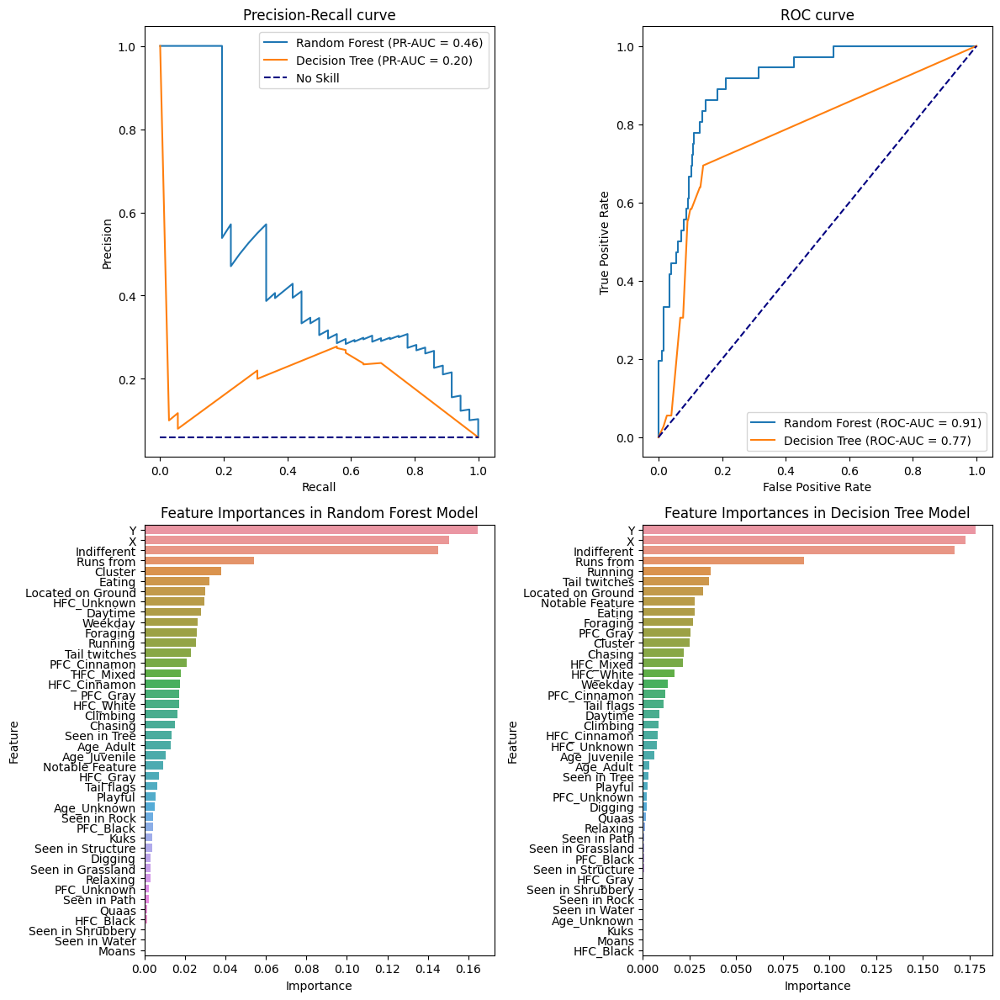

In [53]:
# Use the best random forest estimator to make predictions
best_rf_classifier = rf_grid_search.best_estimator_

# Predict random forest probabilities on the test set
rf_probs = best_rf_classifier.predict_proba(X_test)[:, 1]

# Use the best decision tree estimator to make predictions
best_dt_classifier = dt_grid_search.best_estimator_

# Predict decision tree  probabilities on the test set
dt_probs = best_dt_classifier.predict_proba(X_test)[:, 1]

# Compute Precision-Recall curve and AUC for Random Forest
rf_precision, rf_recall, _ = precision_recall_curve(y_test, rf_probs)
rf_pr_auc = auc(rf_recall, rf_precision)

# Compute Precision-Recall curve and AUC for Decision Tree
dt_precision, dt_recall, _ = precision_recall_curve(y_test, dt_probs)
dt_pr_auc = auc(dt_recall, dt_precision)

# Compute ROC curve and AUC for Random Forest
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_probs)
rf_roc_auc = auc(rf_fpr, rf_tpr)

# Compute ROC curve and AUC for Decision Tree
dt_fpr, dt_tpr, _ = roc_curve(y_test, dt_probs)
dt_roc_auc = auc(dt_fpr, dt_tpr)

# Set up a 2x2 subplot grid
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))

# PR Curve for Random Forest and Decision Tree
ax1.plot(rf_recall, rf_precision, label=f'Random Forest (PR-AUC = {rf_pr_auc:.2f})')
ax1.plot(dt_recall, dt_precision, label=f'Decision Tree (PR-AUC = {dt_pr_auc:.2f})')
proportion_of_positives = np.mean(y_test)
ax1.plot([0, 1], [proportion_of_positives, proportion_of_positives], color='navy', linestyle='--', label='No Skill')
ax1.set_title('Precision-Recall curve')
ax1.set_xlabel('Recall')
ax1.set_ylabel('Precision')
ax1.legend()

# ROC Curve
ax2.plot(rf_fpr, rf_tpr, label=f'Random Forest (ROC-AUC = {rf_roc_auc:.2f})')
ax2.plot(dt_fpr, dt_tpr, label=f'Decision Tree (ROC-AUC = {dt_roc_auc:.2f})')
ax2.plot([0, 1], [0, 1], color='navy', linestyle='--')
ax2.set_title('ROC curve')
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.legend()

# Feature Importances
# Assuming rf_classifier and X are defined and rf_classifier is trained
rf_importances = rf_classifier.feature_importances_
feature_names = X.columns
rf_feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': rf_importances})
rf_feature_importance_df = rf_feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
sns.barplot(x='Importance', y='Feature', data=rf_feature_importance_df, ax=ax3)
ax3.set_title('Feature Importances in Random Forest Model')

# Feature Importances
# Assuming dt_classifier and X are defined and rf_classifier is trained
dt_importances = dt_classifier.feature_importances_
feature_names = X.columns
dt_feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': dt_importances})
dt_feature_importance_df = dt_feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
sns.barplot(x='Importance', y='Feature', data=dt_feature_importance_df, ax=ax4)
ax4.set_title('Feature Importances in Decision Tree Model')

# Adjust layout
plt.tight_layout()
plt.show()

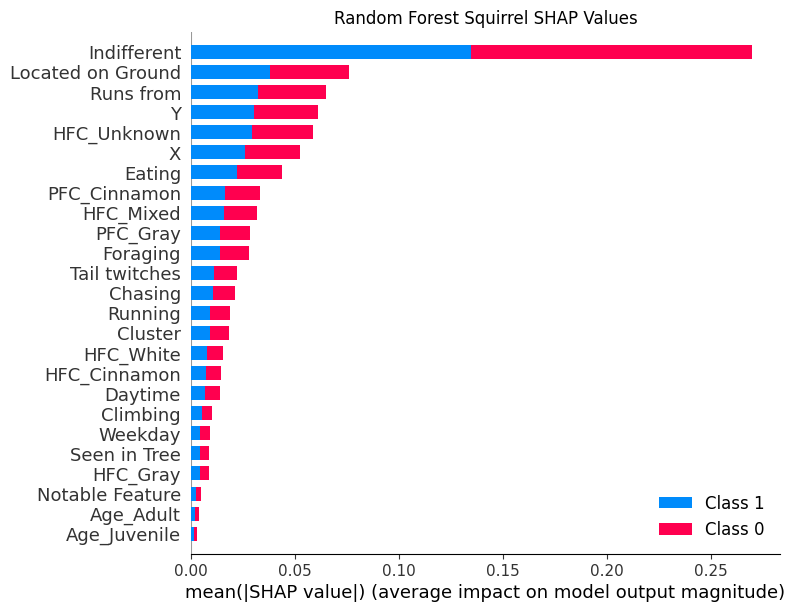

In [62]:
# Initialize the SHAP explainer with the Random Forest model
best_rf_explainer = shap.TreeExplainer(best_rf_classifier)

# Compute SHAP values for the test set
best_rf_shap_values = best_rf_explainer.shap_values(X_test)

# SHAP Summary Plot - plotted separately
shap.summary_plot(best_rf_shap_values, X_test, plot_type="bar",plot_size=[8,6],max_display=25,show=False)
plt.title("Random Forest Squirrel SHAP Values", y=1.0)
plt.show()

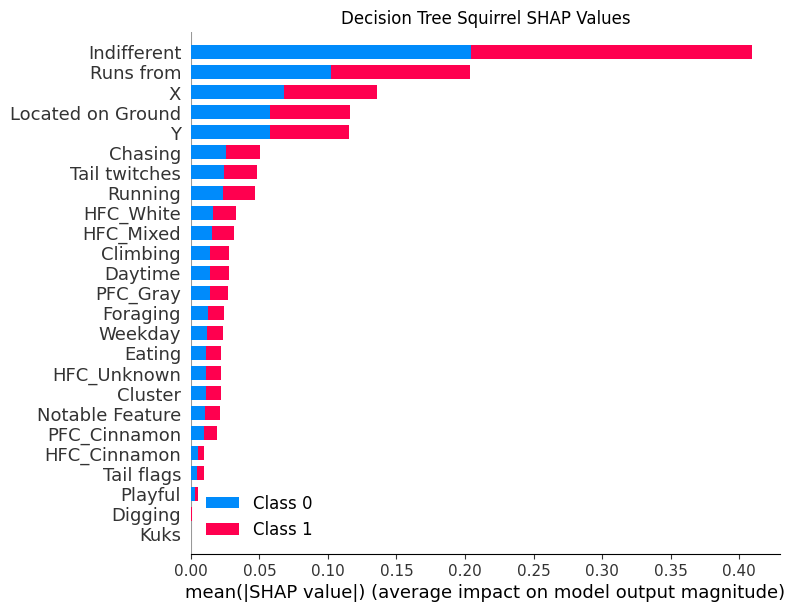

In [63]:
# Initialize the SHAP explainer with the Decision Tree model
best_dt_explainer = shap.TreeExplainer(best_dt_classifier)

# Compute SHAP values for the test set
best_dt_shap_values = best_dt_explainer.shap_values(X_test)

# SHAP Summary Plot - plotted separately
shap.summary_plot(best_dt_shap_values, X_test, plot_type="bar",plot_size=[8,6],max_display=25,show=False)
plt.title("Decision Tree Squirrel SHAP Values", y=1.0)
plt.show()

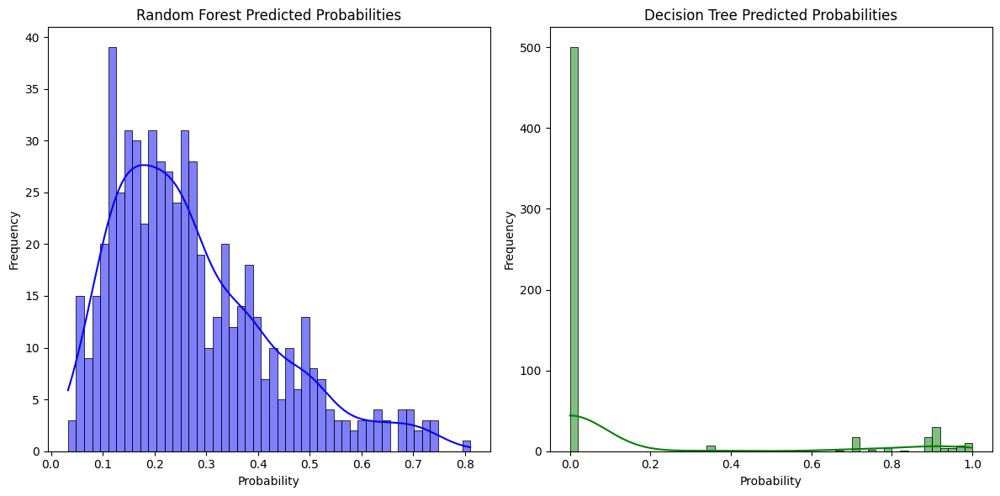

In [64]:
# Set up a subplot grid
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot the probability distributions for Random Forest
sns.histplot(rf_probs, bins=50, kde=True, ax=axes[0], color='blue')
axes[0].set_title('Random Forest Predicted Probabilities')
axes[0].set_xlabel('Probability')
axes[0].set_ylabel('Frequency')

# Plot the probability distributions for Decision Tree
sns.histplot(dt_probs, bins=50, kde=True, ax=axes[1], color='green')
axes[1].set_title('Decision Tree Predicted Probabilities')
axes[1].set_xlabel('Probability')
axes[1].set_ylabel('Frequency')

# Show the plots
plt.tight_layout()
plt.show()

# Model Calibration

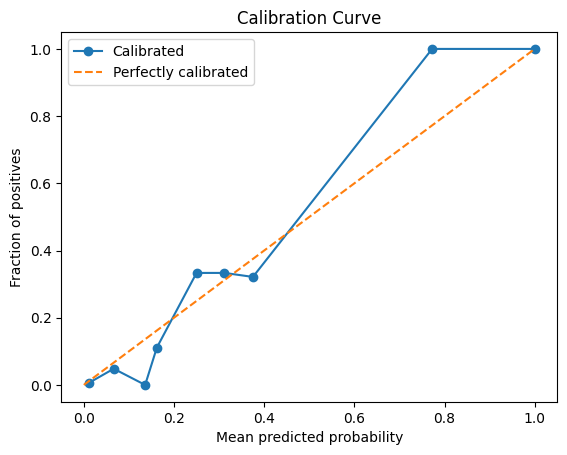

In [120]:
from sklearn.calibration import CalibratedClassifierCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import brier_score_loss
from sklearn.calibration import calibration_curve
import matplotlib.pyplot as plt

# Split your data into training and calibration sets
X_train_2, X_calib, y_train_2, y_calib = train_test_split(X_train, y_train, test_size=0.2)

# Fit the model on the training data
best_rf_classifier.fit(X_train_2, y_train_2)

# Calibrate the model on the calibration data
# Using Platt scaling (method='sigmoid') or Isotonic regression (method='isotonic')
calibrated_rf  = CalibratedClassifierCV(estimator=best_rf_classifier, method='isotonic', cv='prefit')
calibrated_rf.fit(X_calib, y_calib)

# Now you can use calibrated_model to make predictions with calibrated probabilities
calibrated_probs = calibrated_rf.predict_proba(X_test)

# Predict probabilities on the test set
brier_probs = calibrated_rf.predict_proba(X_test)[:, 1]

# Evaluate calibration performance
brier_score = brier_score_loss(y_test, brier_probs)
print(f"Brier score: {brier_score:.4f}")

# Get the calibrated probabilities for the positive class
prob_true, prob_pred = calibration_curve(y_test, calibrated_probs[:, 1], n_bins=20)

# Plotting the calibration curve
plt.plot(prob_pred, prob_true, marker='o', label='Calibrated')
plt.plot([0, 1], [0, 1], linestyle='--', label='Perfectly calibrated')
plt.xlabel('Mean predicted probability')
plt.ylabel('Fraction of positives')
plt.title('Calibration Curve')
plt.legend()
plt.show()

In [121]:
# Predict probabilities on the test set
calibrated_probs = calibrated_rf.predict_proba(X_test)[:, 1]

# Evaluate calibration performance
brier_score = brier_score_loss(y_test, calibrated_probs)
print(f"Brier score: {brier_score:.4f}")

Brier score: 0.0439


Brier score: 0.0445


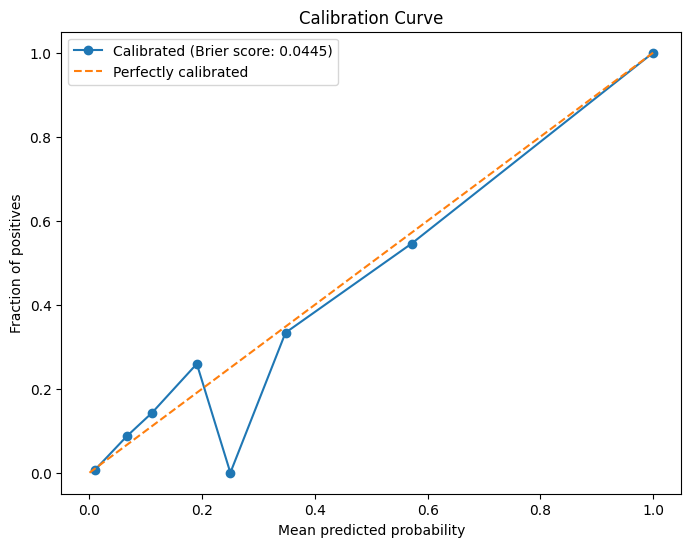

In [131]:
# Split your data into training and calibration sets
X_train_3, X_calib, y_train_3, y_calib = train_test_split(X_train, y_train, test_size=0.2)

# Fit the model on the training data
best_rf_classifier.fit(X_train_3, y_train_3)

# Calibrate the model on the calibration data
# Using Platt scaling (method='sigmoid') or Isotonic regression (method='isotonic')
calibrated_rf2  = CalibratedClassifierCV(estimator=best_rf_classifier, method='isotonic', cv='prefit')
calibrated_rf2.fit(X_calib, y_calib)

# Now you can use calibrated_model to make predictions with calibrated probabilities
calibrated_probs = calibrated_rf2.predict_proba(X_test)

# Predict probabilities on the test set
brier_probs = calibrated_rf2.predict_proba(X_test)[:, 1]
# Evaluate calibration performance
brier_score = brier_score_loss(y_test, brier_probs)
print(f"Brier score: {brier_score:.4f}")

# Get the calibrated probabilities for the positive class
prob_true, prob_pred = calibration_curve(y_test, calibrated_probs[:, 1], n_bins=20)

# Plotting the calibration curve with the Brier score included in the legend
plt.figure(figsize=(8, 6))
plt.plot(prob_pred, prob_true, marker='o', label=f'Calibrated (Brier score: {brier_score:.4f})')
plt.plot([0, 1], [0, 1], linestyle='--', label='Perfectly calibrated')
plt.xlabel('Mean predicted probability')
plt.ylabel('Fraction of positives')
plt.title('Calibration Curve')
plt.legend()
plt.show()

In [132]:
# For binary classification, use predict_proba to get the probability of the positive class
calibrated_probs_test = calibrated_rf.predict_proba(X_test)[:, 1]

# Convert probabilities to binary predictions using a chosen threshold (e.g., 0.5)
predictions = (calibrated_probs_test >= 0.5).astype(int)

In [133]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate various performance metrics
accuracy = accuracy_score(y_test, predictions)
precision = precision_score(y_test, predictions)
recall = recall_score(y_test, predictions)
f1 = f1_score(y_test, predictions)

# Print the metrics
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Accuracy: 0.9421
Precision: 1.0000
Recall: 0.0278
F1 Score: 0.0541


# Saving the Model

In [134]:
import joblib

# Save the model to a file
joblib.dump(calibrated_rf, '/content/drive/MyDrive/SquirrelML/cal_Squirrel_RF.pkl')

# Later on, you can load the model
#calibrated_rf = joblib.load('calibrated_random_forest_model.pkl')

['/content/drive/MyDrive/SquirrelML/cal_Squirrel_RF.pkl']

In [135]:
# If you trained your model with a DataFrame, 'X_train', then:
feature_names = X_train.columns.tolist()
print("Model was trained with the following features:", feature_names)

Model was trained with the following features: ['X', 'Y', 'Daytime', 'Located on Ground', 'Running', 'Chasing', 'Climbing', 'Eating', 'Foraging', 'Kuks', 'Quaas', 'Moans', 'Tail flags', 'Tail twitches', 'Indifferent', 'Runs from', 'Weekday', 'Age_Adult', 'Age_Juvenile', 'Age_Unknown', 'PFC_Black', 'PFC_Cinnamon', 'PFC_Gray', 'PFC_Unknown', 'HFC_Black', 'HFC_Cinnamon', 'HFC_Gray', 'HFC_Mixed', 'HFC_Unknown', 'HFC_White', 'Notable Feature', 'Seen in Tree', 'Seen in Shrubbery', 'Seen in Rock', 'Seen in Grassland', 'Seen in Path', 'Seen in Structure', 'Seen in Water', 'Playful', 'Digging', 'Relaxing', 'Cluster']


# Overlaying coordinates in Geospatially AAccurate NYC Map

In [ ]:
nyc_map = gpd.read_file('/content/drive/MyDrive/SquirrelML/geo_export_0a3d2fab-a76c-40da-bc23-6e335dd753dd.shp')

In [ ]:
geofeather.to_geofeather(nyc_map,'/content/drive/MyDrive/SquirrelML/nyc_map.feather')

<Axes: >

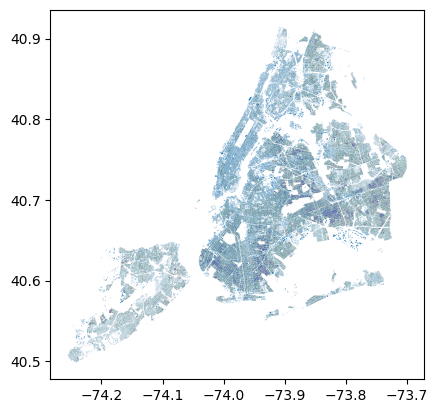

In [ ]:
nyc_map = geofeather.from_geofeather('/content/drive/MyDrive/SquirrelML/nyc_map.feather')
nyc_map.plot()

<ipython-input-8-2017e99dd5ec>:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  nyc_map['centroid'] = nyc_map.geometry.centroid


<Axes: >

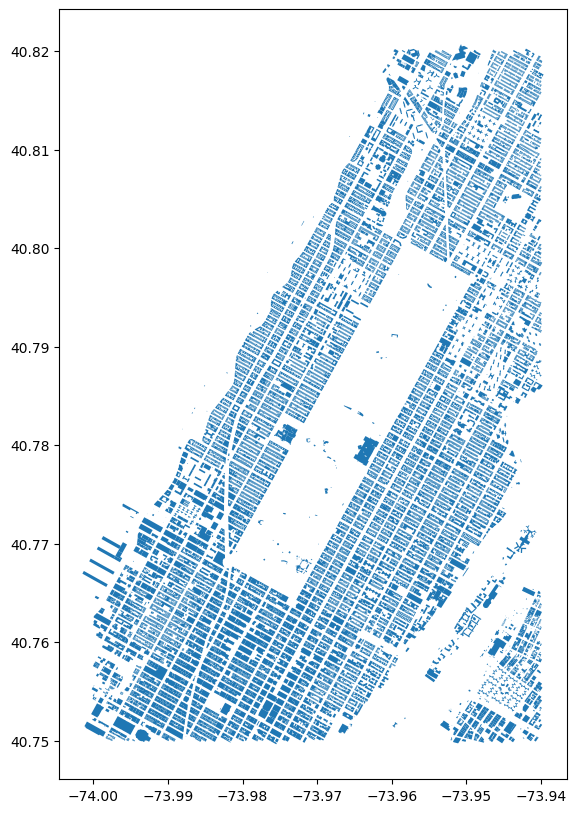

In [ ]:
# Calculate the centroid for each geometry
nyc_map['centroid'] = nyc_map.geometry.centroid

# Filter based on centroid's longitude and latitude
filtered_nyc_map = nyc_map[(nyc_map['centroid'].x >= -74.0) &
                           (nyc_map['centroid'].x <= -73.94) &
                           (nyc_map['centroid'].y >= 40.75) &
                           (nyc_map['centroid'].y <= 40.82)]

# Plot the filtered DataFrame
filtered_nyc_map.plot(figsize=(10, 10), aspect='auto')

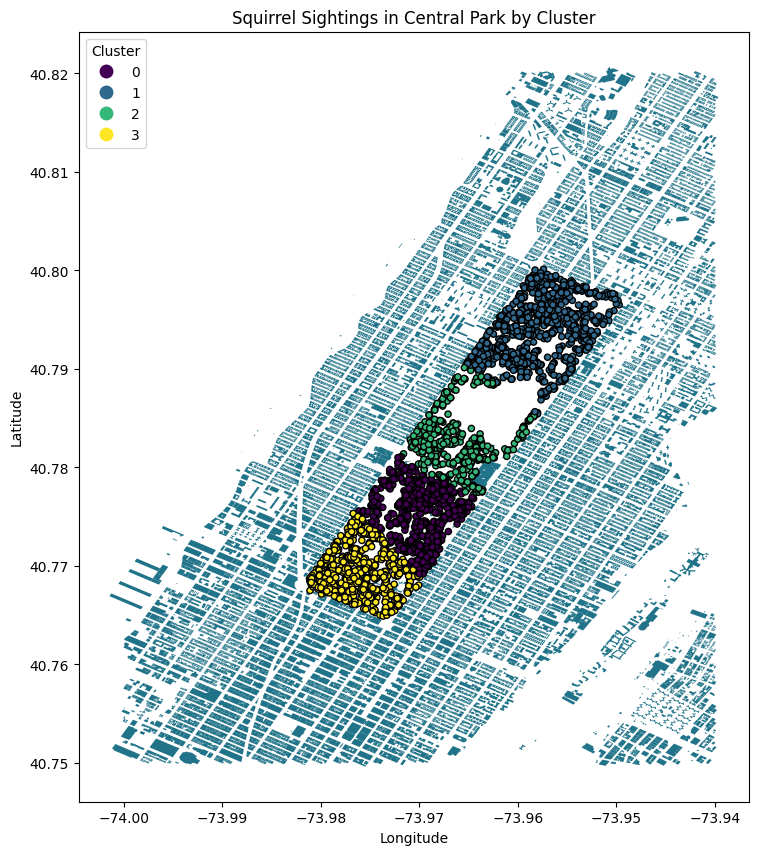

In [ ]:
from shapely.geometry import Point
# Convert the 'X' and 'Y' columns into a GeoSeries of Points
points = gpd.GeoSeries([Point(xy) for xy in zip(squirrel_df['X'], squirrel_df['Y'])])

# Create a new GeoDataFrame
squirrel_geo_df = gpd.GeoDataFrame(squirrel_df, geometry=points)

# Plotting the filtered NYC map
fig, ax = plt.subplots(figsize=(10, 10))

filtered_nyc_map.plot(ax=ax, color='#207388')  # Base map in light grey

# Overlay the squirrel data points, color-coded by 'Cluster'
squirrel_geo_df.plot(ax=ax, column='Cluster', categorical=True, markersize=20,
                     cmap='viridis', legend=True, legend_kwds={'title':'Cluster', 'loc': 'upper left'},
                     facecolors='none' if True else 'black', edgecolors='black')

# Adding labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Squirrel Sightings in Central Park by Cluster')
plt.show()

In [ ]:
print(squirrel_df[['X', 'Y']].describe())

                 X            Y
count  3023.000000  3023.000000
mean    -73.967184    40.780853
std       0.007726     0.010285
min     -73.981159    40.764911
25%     -73.973102    40.771676
50%     -73.968594    40.778166
75%     -73.960189    40.791219
max     -73.949722    40.800119


# Using an LLM to explain the results